## Resumen de reviews
----

Para abordar un resumen de comentarios, se planteo la solución como una especie de modelado de tópicos. 
Dado que pueden ser en múltiples idiomas, en la propuesta de análisis se limito al idioma español.

Aunque en la literatura existen diversos métodos clásicos como
TF-IDF, LDA, el análisis se planteó con BertTopic.

https://maartengr.github.io/BERTopic/getting_started/quickstart/quickstart.html

El cual utiliza modelos de NLP que incorporan los avances recientes como el uso de transformers para tareas multiidioma.

Después de diversos experimentos se presentan las nubes de palabras o wordclouds para dar la respuesta.




In [154]:
#Librerias
import pandas as pd
import numpy as np
#preprocesamiento
import string 
import re
import unidecode

from nltk.corpus import stopwords

## Vector representations
from umap import UMAP
from hdbscan import HDBSCAN
from sentence_transformers import SentenceTransformer


from bertopic import BERTopic

from bertopic.vectorizers import ClassTfidfTransformer


from sklearn.feature_extraction.text import CountVectorizer

import seaborn as sns

In [80]:
stopspanish=stopwords.words('spanish')

In [65]:
!pip install unidecode

     |████████████████████████████████| 235 kB 582 kB/s eta 0:00:01
Note: you may need to restart the kernel to use updated packages.


In [6]:
df_places=pd.read_csv("places_details.csv")

In [5]:
df_reviews=pd.read_csv("places_reviews.csv")

## Preprocesamiento
--

In [12]:
df_places.shape,df_reviews.shape

((114, 25), (47019, 9))

In [13]:
df_place.columns

Index(['place_id', 'name', 'business_status', 'latitude', 'longitude',
       'user_ratings_total', 'rating', 'website', 'price_level', 'photos',
       'sunday_open', 'sunday_close', 'monday_open', 'monday_close',
       'tuesday_open', 'tuesday_close', 'wednesday_open', 'wednesday_close',
       'thursday_open', 'thursday_close', 'friday_open', 'friday_close',
       'saturday_open', 'saturday_close', 'tipo_lugar'],
      dtype='object')

In [14]:
df_reviews.columns

Index(['url', 'reviewer', 'reviewer_avatar', 'datetime', 'rating', 'text',
       'language', 'id', 'place_id'],
      dtype='object')

<AxesSubplot:xlabel='language', ylabel='count'>

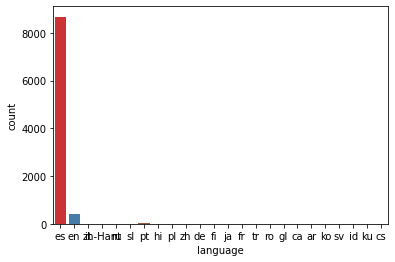

In [21]:
sns.countplot(x=df_reviews["language"],palette = "Set1")

<AxesSubplot:xlabel='language', ylabel='Density'>

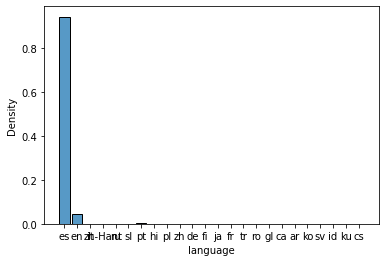

In [23]:
sns.histplot(x=df_reviews["language"],palette = "Set1",stat = 'density', shrink = 0.8, common_norm=False)

In [24]:
df_reviews.head()

,url,reviewer,reviewer_avatar,datetime,rating,text,language,id,place_id
0,https://www.google.com/maps/reviews/data=!4m5!...,Josial Iszsa,https://lh3.googleusercontent.com/a-/AOh14GhZ0...,2020-07-30T00:26:00Z,5.0,"Higiene, medidas de sana distancia, excelente ...",es,17546225955757877359-1596057977.804,ChIJ_6PxIP_-0YURb-iv-Yq3gPM
1,https://www.google.com/maps/reviews/data=!4m5!...,Osvaldo Caballero,https://lh4.googleusercontent.com/-5ebzE6LwgJ4...,2020-07-08T00:18:00Z,5.0,Buen lugar para comer y pasar el rato,es,17546225955757877359-1594156694.121,ChIJ_6PxIP_-0YURb-iv-Yq3gPM
2,https://www.google.com/maps/reviews/data=!4m5!...,Marbella Miss,https://lh3.googleusercontent.com/a-/AOh14Gjc-...,2020-03-19T07:53:00Z,5.0,Súper delicioso todo y muy económico 🥰❤️❤️,es,17546225955757877359-1584593609.046,ChIJ_6PxIP_-0YURb-iv-Yq3gPM
3,https://www.google.com/maps/reviews/data=!4m5!...,Erick romero casas,https://lh3.googleusercontent.com/a-/AOh14GjFo...,2020-03-13T00:27:00Z,4.0,"Muy buen servicio, costos un poco elevados",es,17546225955757877359-1584048420.225,ChIJ_6PxIP_-0YURb-iv-Yq3gPM
4,https://www.google.com/maps/reviews/data=!4m5!...,Yoscelina Gomez,https://lh3.googleusercontent.com/a-/AOh14Gig6...,2020-03-08T03:49:00Z,3.0,"Comida rica, buen precio, atención normal, la ...",es,17546225955757877359-1583628551.982,ChIJ_6PxIP_-0YURb-iv-Yq3gPM


In [81]:
def getLimpiezaSpanish(x):
    x=x.strip()
    xlower=x.lower()
    xlower= re.sub('[%s]' % re.escape(string.punctuation), '', xlower)
    xlower = re.sub(r'(!|.)1+', '', xlower)
    xlower=remove_emoji(xlower)
    xlower=xlower.strip()
    tokens = xlower.split()
    tokens = [token  for token in tokens if not (token.isnumeric())]
    tokens = [token for token in tokens if token not in stopspanish]
    texto = " ".join(tokens)
    texto =unidecode.unidecode(texto)
    return texto
    
    

#remover acentos
def remove_accents(x):
    """
    Removes common accent characters, lower form.
    Uses: regex.
    """
    new=x
    new = re.sub(r'[àáâãäå]', 'a', new)
    new = re.sub(r'[èéêë]', 'e', new)
    new = re.sub(r'[ìíîï]', 'i', new)
    new = re.sub(r'[òóôõö]', 'o', new)
    new = re.sub(r'[ùúûü]', 'u', new)
    return new

def remove_emoji(string):
    emoji_pattern = re.compile("["
                               u"\U0001F600-\U0001F64F"  # emoticons
                               u"\U0001F300-\U0001F5FF"  # symbols & pictographs
                               u"\U0001F680-\U0001F6FF"  # transport & map symbols
                               u"\U0001F1E0-\U0001F1FF"  # flags (iOS)
                               u"\U00002500-\U00002BEF"  # chinese char
                               u"\U00002702-\U000027B0"
                               u"\U00002702-\U000027B0"
                               u"\U000024C2-\U0001F251"
                               u"\U0001f926-\U0001f937"
                               u"\U00010000-\U0010ffff"
                               u"\u2640-\u2642"
                               u"\u2600-\u2B55"
                               u"\u200d"
                               u"\u23cf"
                               u"\u23e9"
                               u"\u231a"
                               u"\ufe0f"  # dingbats
                               u"\u3030"
                               "]+", flags=re.UNICODE)
    return emoji_pattern.sub(r'', string)


In [70]:
df_spanish=df_reviews[df_reviews["language"]=="es"].reset_index()

In [71]:
df_spanish.head()

,index,url,reviewer,reviewer_avatar,datetime,rating,text,language,id,place_id
0,0,https://www.google.com/maps/reviews/data=!4m5!...,Josial Iszsa,https://lh3.googleusercontent.com/a-/AOh14GhZ0...,2020-07-30T00:26:00Z,5.0,"Higiene, medidas de sana distancia, excelente ...",es,17546225955757877359-1596057977.804,ChIJ_6PxIP_-0YURb-iv-Yq3gPM
1,1,https://www.google.com/maps/reviews/data=!4m5!...,Osvaldo Caballero,https://lh4.googleusercontent.com/-5ebzE6LwgJ4...,2020-07-08T00:18:00Z,5.0,Buen lugar para comer y pasar el rato,es,17546225955757877359-1594156694.121,ChIJ_6PxIP_-0YURb-iv-Yq3gPM
2,2,https://www.google.com/maps/reviews/data=!4m5!...,Marbella Miss,https://lh3.googleusercontent.com/a-/AOh14Gjc-...,2020-03-19T07:53:00Z,5.0,Súper delicioso todo y muy económico 🥰❤️❤️,es,17546225955757877359-1584593609.046,ChIJ_6PxIP_-0YURb-iv-Yq3gPM
3,3,https://www.google.com/maps/reviews/data=!4m5!...,Erick romero casas,https://lh3.googleusercontent.com/a-/AOh14GjFo...,2020-03-13T00:27:00Z,4.0,"Muy buen servicio, costos un poco elevados",es,17546225955757877359-1584048420.225,ChIJ_6PxIP_-0YURb-iv-Yq3gPM
4,4,https://www.google.com/maps/reviews/data=!4m5!...,Yoscelina Gomez,https://lh3.googleusercontent.com/a-/AOh14Gig6...,2020-03-08T03:49:00Z,3.0,"Comida rica, buen precio, atención normal, la ...",es,17546225955757877359-1583628551.982,ChIJ_6PxIP_-0YURb-iv-Yq3gPM


In [82]:
df_spanish["text_clean"] = df_spanish["text"].apply(lambda x:getLimpiezaSpanish(x))

In [83]:
df_spanish.head()

,index,url,reviewer,reviewer_avatar,datetime,rating,text,language,id,place_id,text_clean
0,0,https://www.google.com/maps/reviews/data=!4m5!...,Josial Iszsa,https://lh3.googleusercontent.com/a-/AOh14GhZ0...,2020-07-30T00:26:00Z,5.0,"Higiene, medidas de sana distancia, excelente ...",es,17546225955757877359-1596057977.804,ChIJ_6PxIP_-0YURb-iv-Yq3gPM,higiene medidas sana distancia excelente calid...
1,1,https://www.google.com/maps/reviews/data=!4m5!...,Osvaldo Caballero,https://lh4.googleusercontent.com/-5ebzE6LwgJ4...,2020-07-08T00:18:00Z,5.0,Buen lugar para comer y pasar el rato,es,17546225955757877359-1594156694.121,ChIJ_6PxIP_-0YURb-iv-Yq3gPM,buen lugar comer pasar rato
2,2,https://www.google.com/maps/reviews/data=!4m5!...,Marbella Miss,https://lh3.googleusercontent.com/a-/AOh14Gjc-...,2020-03-19T07:53:00Z,5.0,Súper delicioso todo y muy económico 🥰❤️❤️,es,17546225955757877359-1584593609.046,ChIJ_6PxIP_-0YURb-iv-Yq3gPM,super delicioso economico
3,3,https://www.google.com/maps/reviews/data=!4m5!...,Erick romero casas,https://lh3.googleusercontent.com/a-/AOh14GjFo...,2020-03-13T00:27:00Z,4.0,"Muy buen servicio, costos un poco elevados",es,17546225955757877359-1584048420.225,ChIJ_6PxIP_-0YURb-iv-Yq3gPM,buen servicio costos elevados
4,4,https://www.google.com/maps/reviews/data=!4m5!...,Yoscelina Gomez,https://lh3.googleusercontent.com/a-/AOh14Gig6...,2020-03-08T03:49:00Z,3.0,"Comida rica, buen precio, atención normal, la ...",es,17546225955757877359-1583628551.982,ChIJ_6PxIP_-0YURb-iv-Yq3gPM,comida rica buen precio atencion normal barrit...


## Representacion vectorial de los textos
-------------

In [85]:
corpus = df_spanish["text_clean"].tolist()

In [100]:
embedding_model = SentenceTransformer('distiluse-base-multilingual-cased-v1')

In [92]:
umap_model = UMAP(n_neighbors=15, n_components=5, min_dist=0.0, metric='cosine')

In [127]:
hdbscan_model = HDBSCAN(min_cluster_size=15, metric='euclidean', cluster_selection_method='eom', prediction_data=True)

vectorizer_model = CountVectorizer(stop_words=stopspanish)
# Step 5 - Create topic representation
ctfidf_model = ClassTfidfTransformer()

In [128]:
topic_model = BERTopic(
    embedding_model=embedding_model,          # Step 1 - Extract embeddings
  umap_model=umap_model,                    # Step 2 - Reduce dimensionality
  hdbscan_model=hdbscan_model,              # Step 3 - Cluster reduced embeddings
  vectorizer_model=vectorizer_model,        # Step 4 - Tokenize topics
  ctfidf_model=ctfidf_model,nr_topics=5)                # Step 5 - Extract topic words
  
topics, probs = topic_model.fit_transform(corpus)

In [129]:
topic_model.visualize_topics()



In [131]:
topic_model.get_topic_info()

,Topic,Count,Name
0,-1,5935,-1_lugar_excelente_atencion_servicio
1,0,823,0_excelente_comida_atencion_lugar
2,1,649,1_servicio_buen_excelente_lugar
3,2,491,2_delicioso_lugar_exelente_excelente
4,3,444,3_precios_precio_comida_rica
5,4,335,4_mexicana_comida_mexico_lugar


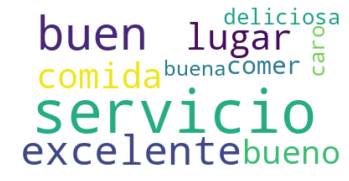

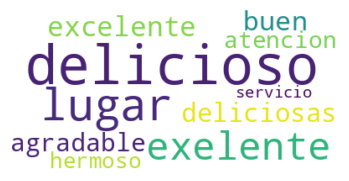

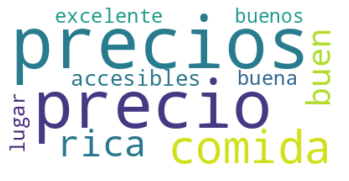

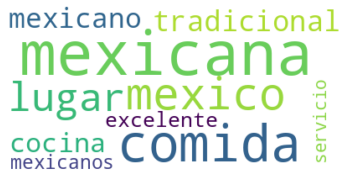

In [153]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

def create_wordcloud(model, topic):
    text = {word: value for word, value in model.get_topic(topic)}
    wc = WordCloud(background_color="white", max_words=1000)
    wc.generate_from_frequencies(text)
    wc.to_file("topic_"+str(topic)+".png")
    plt.imshow(wc, interpolation="bilinear")
    plt.axis("off")
    plt.show()

for i in range(1,5):
    create_wordcloud(topic_model, topic=i)

In [137]:
topic_model.visualize_heatmap()

In [138]:
topic_model.visualize_barchart()

In [139]:
topic_model.visualize_term_rank()

In [140]:
topic_model.visualize_hierarchy()

In [142]:
hierarchical_topics = topic_model.hierarchical_topics(corpus)

100%|████████████████████████████████████████████| 4/4 [00:00<00:00, 199.22it/s]


In [143]:
embeddings = embedding_model.encode(corpus, show_progress_bar=False)

In [147]:
topic_model2 = BERTopic().fit(corpus, embeddings)
hierarchical_topics = topic_model2.hierarchical_topics(corpus)

100%|████████████████████████████████████████| 186/186 [00:00<00:00, 212.74it/s]


In [149]:
# Run the visualization with the original embeddings
#topic_model2.visualize_hierarchical_documents(corpus, hierarchical_topics, embeddings=embeddings)

# Reduce dimensionality of embeddings, this step is optional but much faster to perform iteratively:
reduced_embeddings = UMAP(n_neighbors=20, n_components=2, min_dist=0.0, metric='cosine').fit_transform(embeddings)
topic_model2.visualize_hierarchical_documents(corpus, hierarchical_topics, reduced_embeddings=reduced_embeddings)
